In [132]:
from sklearnex import patch_sklearn
patch_sklearn()

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import numpy as np
from scipy import stats

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from sklearn.decomposition import PCA, FastICA
from sklearn.random_projection import GaussianRandomProjection
from sklearn.manifold import TSNE

from utils import get_data, calc_reconstruction_error

# sns.set_theme(rc={'figure.figsize':(11.7,8.27)})

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [133]:
X, y, metadata, variables = get_data('wine_quality')
X.shape

(6497, 11)

In [134]:
y.value_counts(normalize=True)

quality
6          0.436509
5          0.329075
7          0.166077
4          0.033246
8          0.029706
3          0.004618
9          0.000770
Name: proportion, dtype: float64

In [135]:
# Split data into train and test sets.
# We use Stratifield sampling to ensure that the distribution of the data is maintained across the sample.
# Use stratified kfold cross validation to ensure that the model is not overfitting the data

TEST_SIZE = 0.2
RANDOM_STATE = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE, stratify=y)

# Apply PCA

In [136]:
RANDOM_STATE = 42
PCA_N_COMPONENTS = X_train.shape[1]

scaler = StandardScaler()
dim_redn = PCA(n_components=PCA_N_COMPONENTS, random_state=RANDOM_STATE)

dr_pipeline = Pipeline(steps=[
    ('scaler', scaler),
    ('dim_redn', dim_redn)
])


In [137]:
dr_pipeline.fit(X_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('dim_redn', PCA(n_components=11, random_state=42))])

<Axes: title={'center': 'Explained Variance by Number of Components'}, xlabel='n_components'>

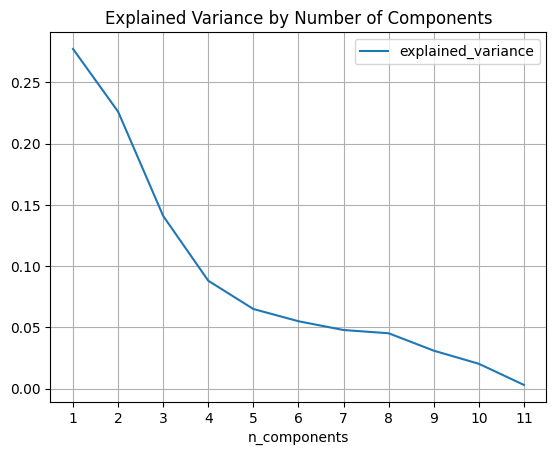

In [138]:
expl_var = pd.DataFrame({'n_components': range(1, PCA_N_COMPONENTS+1), 
'explained_variance': dr_pipeline.named_steps['dim_redn'].explained_variance_ratio_})

expl_var.plot(x='n_components', y='explained_variance', title='Explained Variance by Number of Components', xticks=expl_var['n_components'], grid=True)

In [139]:
# Calculate the reconstruction error for different number of components
pca_recon_err = {}
for n_components in range(1, PCA_N_COMPONENTS+1):
    dr_pipeline = Pipeline(steps=[
        ('scaler', scaler),
        ('dim_redn', PCA(n_components=n_components, random_state=RANDOM_STATE))
    ])
    
    X_transformed = dr_pipeline.fit_transform(X_train)
    X_reconstructed = dr_pipeline.inverse_transform(X_transformed)

    reconstruction_error = calc_reconstruction_error(X_train, X_reconstructed)
    print(f'PCA with {n_components} components has a reconstruction error of {reconstruction_error:.2f}')
    pca_recon_err[n_components] = reconstruction_error


PCA with 1 components has a reconstruction error of 1027.73
PCA with 2 components has a reconstruction error of 973.47
PCA with 3 components has a reconstruction error of 899.60
PCA with 4 components has a reconstruction error of 722.97
PCA with 5 components has a reconstruction error of 657.32
PCA with 6 components has a reconstruction error of 588.04
PCA with 7 components has a reconstruction error of 538.31
PCA with 8 components has a reconstruction error of 508.67
PCA with 9 components has a reconstruction error of 393.47
PCA with 10 components has a reconstruction error of 0.54
PCA with 11 components has a reconstruction error of 0.00


<Axes: title={'center': 'Reconstruction Error by Number of Components'}, xlabel='n_components'>

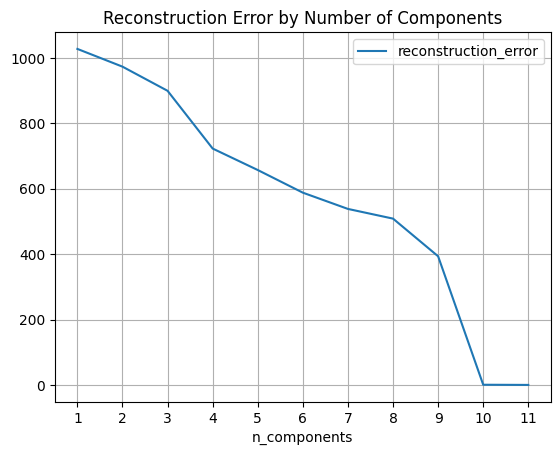

In [140]:
pca_recon_err_df = pd.DataFrame(pca_recon_err.items(), columns=['n_components', 'reconstruction_error'])
pca_recon_err_df.plot(x='n_components', y='reconstruction_error', title='Reconstruction Error by Number of Components', xticks=pca_recon_err_df['n_components'], grid=True)

<Axes: xlabel='fixed_acidity', ylabel='volatile_acidity'>

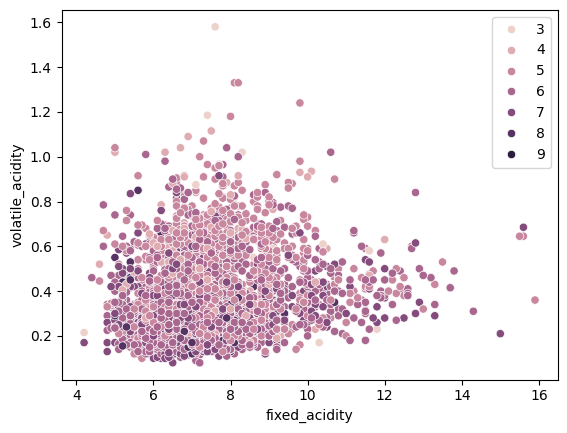

In [141]:
sns.scatterplot(x=X_train.iloc[:, 0], y=X_train.iloc[:, 1], hue=y_train.values.ravel())

<Axes: >

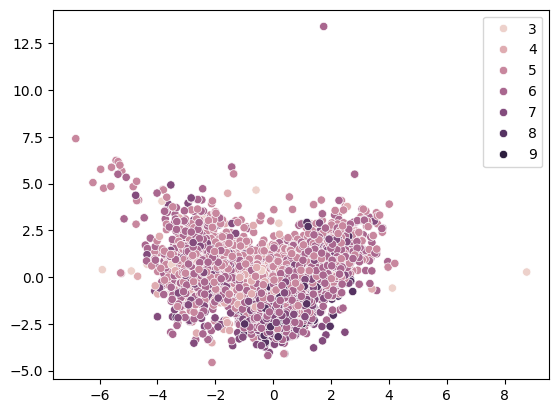

In [142]:
X_transformed = dr_pipeline.fit_transform(X_train)

sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1], hue=y_train.values.ravel())

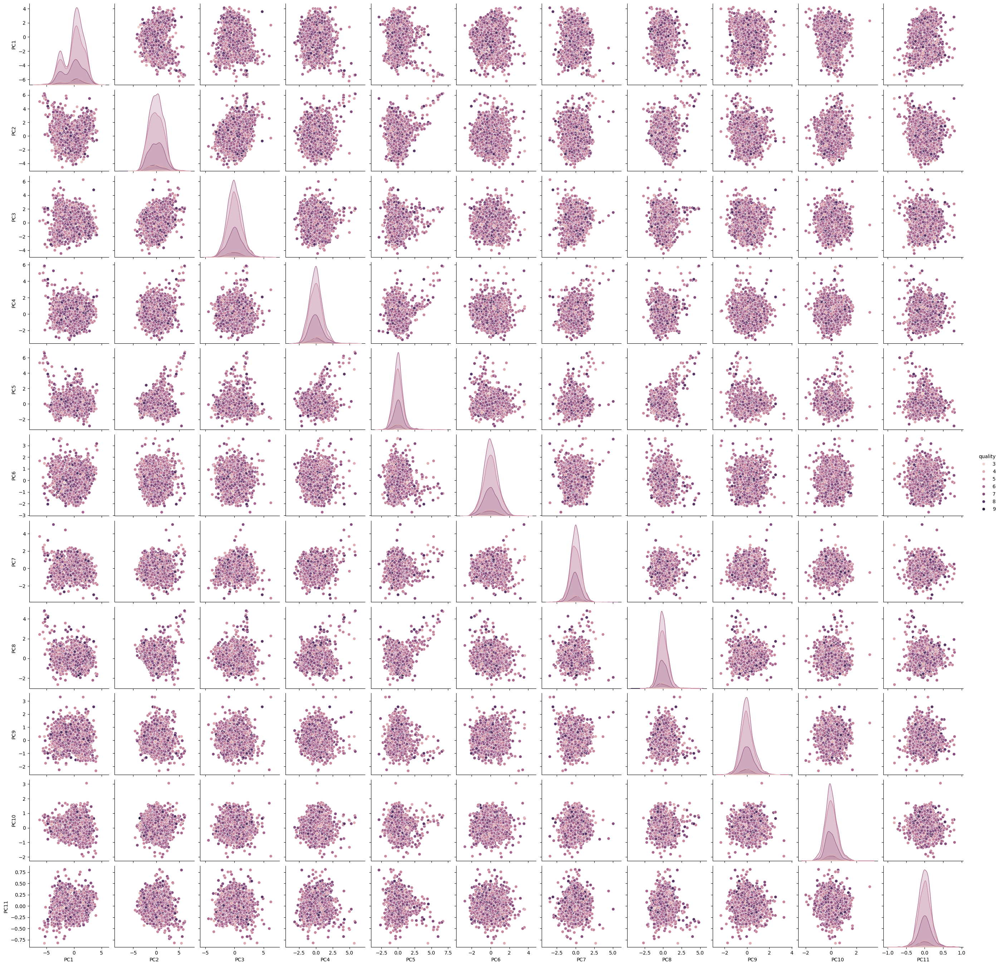

In [143]:
X_transformed_df = pd.DataFrame(X_transformed, columns=[f'PC{i}' for i in range(1, PCA_N_COMPONENTS+1)])
plot_df = pd.concat([X_transformed_df, y_train], axis=1)
plot_df

sns.pairplot(plot_df, x_vars=[f'PC{i}' for i in range(1, PCA_N_COMPONENTS+1)], hue='quality')

# Apply ICA

In [144]:
RANDOM_STATE = 42

scaler = StandardScaler()
dim_redn = FastICA(random_state=RANDOM_STATE)

dr_pipeline = Pipeline(steps=[
    ('scaler', scaler),
    ('dim_redn', dim_redn)
])


In [145]:
results = []
ica_recon_err = {}
for n_components in range(1, X_train.shape[1]+1):
    print(f"---------- n_components: {n_components} ----------")
    dr_pipeline.set_params(dim_redn__n_components=n_components)

    X_transformed = dr_pipeline.fit_transform(X_train)
    
    res = stats.kurtosistest(X_transformed)
    res.statistic, res.pvalue
    
    results.append(pd.DataFrame({'n_components': [n_components]*n_components,
                            'component': np.arange(1, n_components+1),
                             'kurtosis_stat': res.statistic,
                             'kurtosis_pvalue': res.pvalue}
                           ))
    
    X_reconstructed = dr_pipeline.inverse_transform(X_transformed)
    reconstruction_error = calc_reconstruction_error(X_train, X_reconstructed)

    print(f'ICA with {n_components} components has a reconstruction error of {reconstruction_error:.2f}')
    ica_recon_err[n_components] = reconstruction_error


---------- n_components: 1 ----------
ICA with 1 components has a reconstruction error of 1027.73
---------- n_components: 2 ----------
ICA with 2 components has a reconstruction error of 973.47
---------- n_components: 3 ----------
ICA with 3 components has a reconstruction error of 899.60
---------- n_components: 4 ----------
ICA with 4 components has a reconstruction error of 722.97
---------- n_components: 5 ----------
ICA with 5 components has a reconstruction error of 657.32
---------- n_components: 6 ----------
ICA with 6 components has a reconstruction error of 588.04
---------- n_components: 7 ----------
ICA with 7 components has a reconstruction error of 538.31
---------- n_components: 8 ----------
ICA with 8 components has a reconstruction error of 508.67
---------- n_components: 9 ----------
ICA with 9 components has a reconstruction error of 393.47
---------- n_components: 10 ----------
ICA with 10 components has a reconstruction error of 0.54
---------- n_components: 11 -

In [146]:
results_df  = pd.concat(results)

<Axes: xlabel='component', ylabel='kurtosis_stat'>

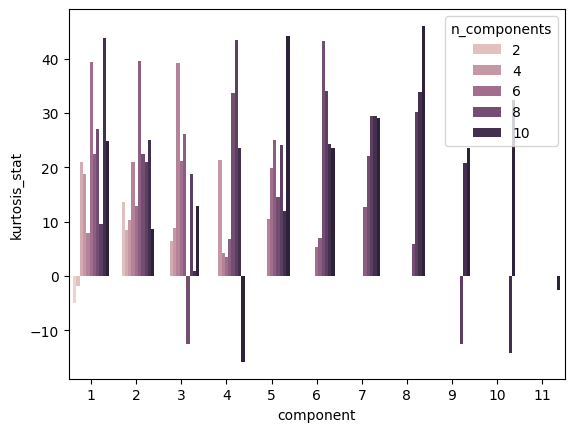

In [147]:
sns.barplot(x='component', y='kurtosis_stat', data=results_df, hue='n_components')

<Axes: xlabel='n_components', ylabel='kurtosis_stat'>

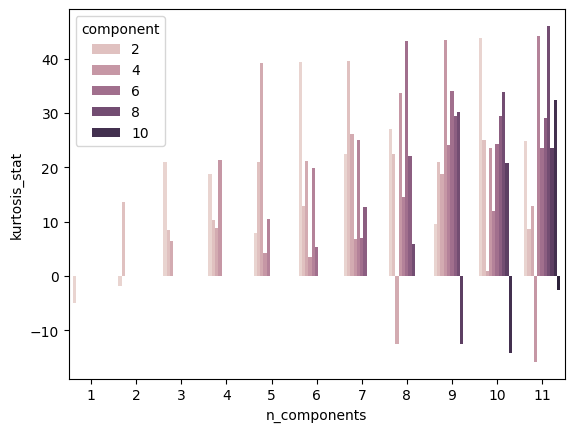

In [148]:
sns.barplot(x='n_components', y='kurtosis_stat', data=results_df, hue='component')

<Axes: xlabel='component', ylabel='kurtosis_pvalue'>

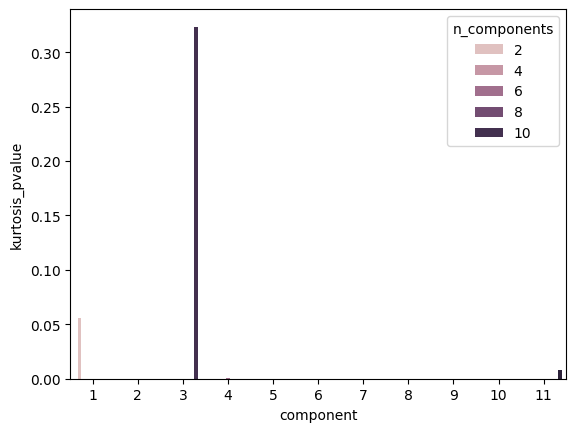

In [149]:
sns.barplot(x='component', y='kurtosis_pvalue', data=results_df, hue='n_components')

<Axes: xlabel='component', ylabel='kurtosis_pvalue'>

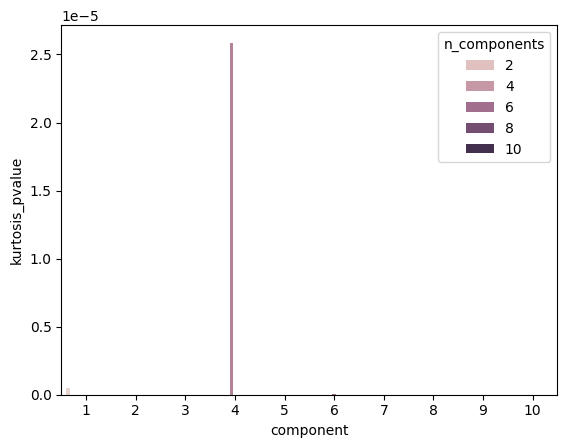

In [150]:
sns.barplot(x='component', y='kurtosis_pvalue', data=results_df.query('kurtosis_pvalue < 0.0001'), hue='n_components')

<Axes: title={'center': 'Reconstruction Error by Number of Components'}, xlabel='n_components'>

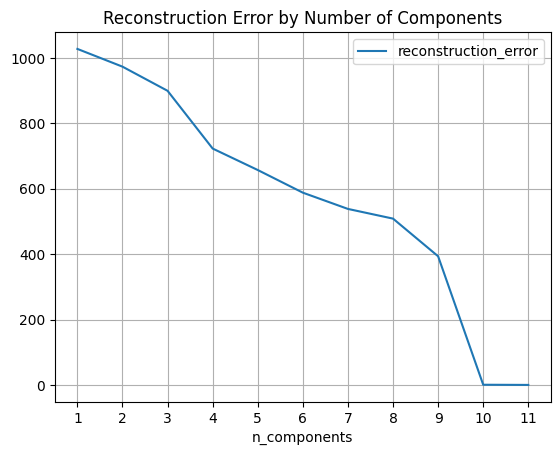

In [151]:
ica_recon_err_df = pd.DataFrame(ica_recon_err.items(), columns=['n_components', 'reconstruction_error'])
ica_recon_err_df.plot(x='n_components', y='reconstruction_error', title='Reconstruction Error by Number of Components', xticks=ica_recon_err_df['n_components'], grid=True)

<Axes: >

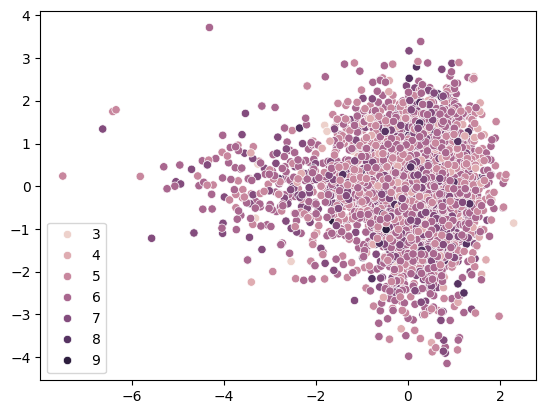

In [152]:
X_transformed = dr_pipeline.fit_transform(X_train)

sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1], hue=y_train.values.ravel())


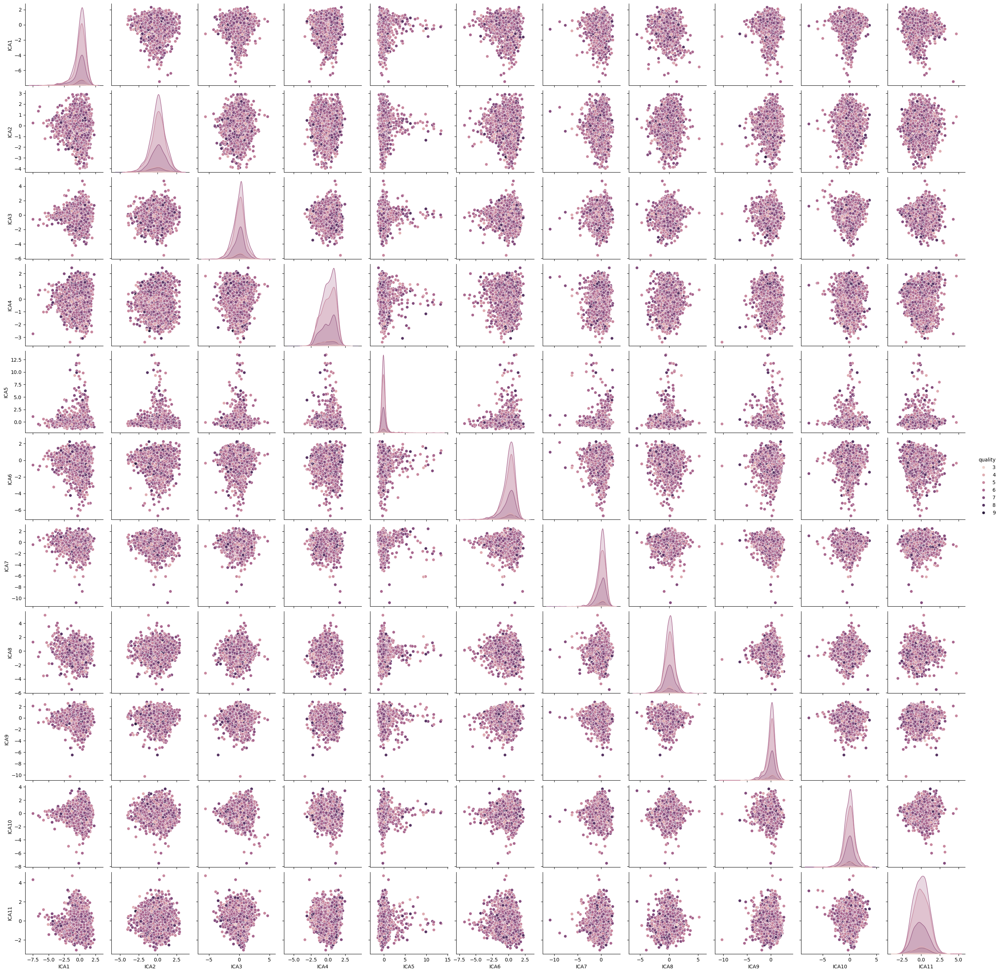

In [153]:
X_transformed_df = pd.DataFrame(X_transformed, columns=[f'ICA{i}' for i in range(1, X_train.shape[1]+1)])
plot_df = pd.concat([X_transformed_df, y_train], axis=1)
# plot_df

sns.pairplot(plot_df, x_vars=[f'ICA{i}' for i in range(1, X_train.shape[1]+1)], hue='quality')

# Apply Gaussian projection

In [154]:
RANDOM_STATE = 42

scaler = StandardScaler()
dim_redn = GaussianRandomProjection(random_state=RANDOM_STATE)

dr_pipeline = Pipeline(steps=[
    ('scaler', scaler),
    ('dim_redn', dim_redn)
])

In [155]:
# reconstruction error
rand_proj_recon_err = {}
for n_components in range(1, X_train.shape[1]+1):
    print(f"---------- n_components: {n_components} ----------")
    dr_pipeline.set_params(dim_redn__n_components=n_components)

    X_transformed = dr_pipeline.fit_transform(X_train)
    X_reconstructed = dr_pipeline.inverse_transform(X_transformed)
    reconstruction_error = calc_reconstruction_error(X_train, X_reconstructed)

    print(f'GaussRandProj with {n_components} components has a reconstruction error of {reconstruction_error:.2f}')
    rand_proj_recon_err[n_components] = reconstruction_error


---------- n_components: 1 ----------
GaussRandProj with 1 components has a reconstruction error of 2224.83
---------- n_components: 2 ----------
GaussRandProj with 2 components has a reconstruction error of 2133.61
---------- n_components: 3 ----------
GaussRandProj with 3 components has a reconstruction error of 2349.40
---------- n_components: 4 ----------
GaussRandProj with 4 components has a reconstruction error of 2421.76
---------- n_components: 5 ----------
GaussRandProj with 5 components has a reconstruction error of 2431.76
---------- n_components: 6 ----------
GaussRandProj with 6 components has a reconstruction error of 2050.83
---------- n_components: 7 ----------
GaussRandProj with 7 components has a reconstruction error of 1723.65
---------- n_components: 8 ----------
GaussRandProj with 8 components has a reconstruction error of 1411.76
---------- n_components: 9 ----------
GaussRandProj with 9 components has a reconstruction error of 1582.48
---------- n_components: 10 

<Axes: title={'center': 'Reconstruction Error by Number of Components'}, xlabel='n_components'>

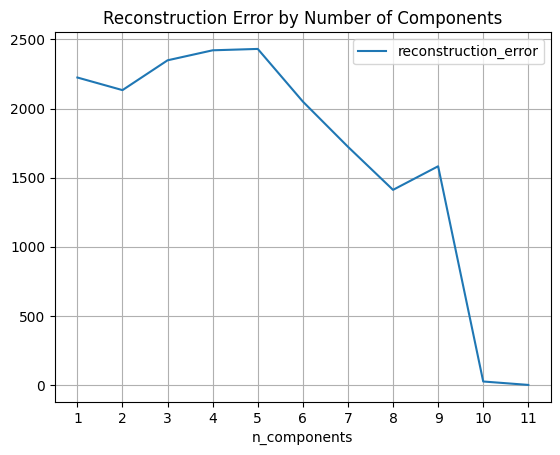

In [156]:
rand_proj_recon_err = pd.DataFrame(rand_proj_recon_err.items(), columns=['n_components', 'reconstruction_error'])
rand_proj_recon_err.plot(x='n_components', y='reconstruction_error', title='Reconstruction Error by Number of Components', xticks=rand_proj_recon_err['n_components'], grid=True)

<Axes: >

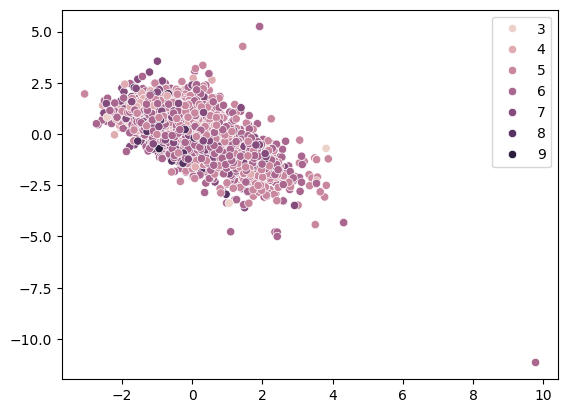

In [157]:
X_transformed = dr_pipeline.fit_transform(X_train)

sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1],  hue=y_train.values.ravel())

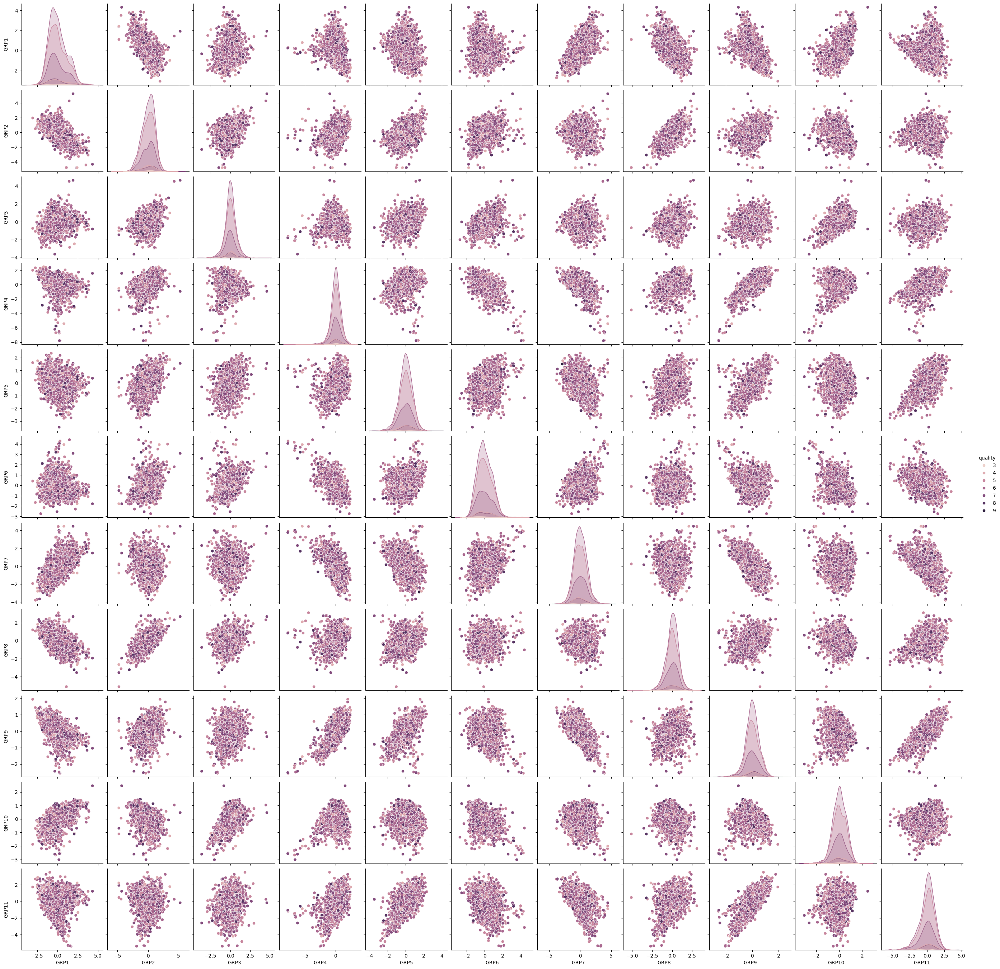

In [158]:
X_transformed_df = pd.DataFrame(X_transformed, columns=[f'GRP{i}' for i in range(1, X_train.shape[1]+1)])
plot_df = pd.concat([X_transformed_df, y_train], axis=1)
# plot_df

sns.pairplot(plot_df, x_vars=[f'GRP{i}' for i in range(1, X_train.shape[1]+1)], hue='quality')

# Apply t-SNE

In [159]:
RANDOM_STATE = 42

scaler = StandardScaler()
dim_redn = TSNE(random_state=RANDOM_STATE)

dr_pipeline = Pipeline(steps=[
    ('scaler', scaler),
    ('dim_redn', dim_redn)
])

In [160]:

tsne_kl_divergence = {}
for n_components in range(1, 4):
    print(f"---------- n_components: {n_components} ----------")
    dr_pipeline.set_params(dim_redn__n_components=n_components)

    dr_pipeline.fit(X_train)
    
    kl_divergence = dr_pipeline.named_steps['dim_redn'].kl_divergence_

    print(f'TSNE with {n_components} components has a kl_divergence of {kl_divergence:.2f}')
    tsne_kl_divergence[n_components] = kl_divergence

---------- n_components: 1 ----------


c:\Users\pavan\anaconda3\envs\ml\Lib\site-packages\daal4py\sklearn\manifold\_t_sne.py:396: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


TSNE with 1 components has a kl_divergence of 2.30
---------- n_components: 2 ----------


c:\Users\pavan\anaconda3\envs\ml\Lib\site-packages\daal4py\sklearn\manifold\_t_sne.py:396: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


TSNE with 2 components has a kl_divergence of 1.60
---------- n_components: 3 ----------


c:\Users\pavan\anaconda3\envs\ml\Lib\site-packages\daal4py\sklearn\manifold\_t_sne.py:396: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


TSNE with 3 components has a kl_divergence of 1.16


<Axes: title={'center': 'KL Divergence by Number of Components'}, xlabel='n_components'>

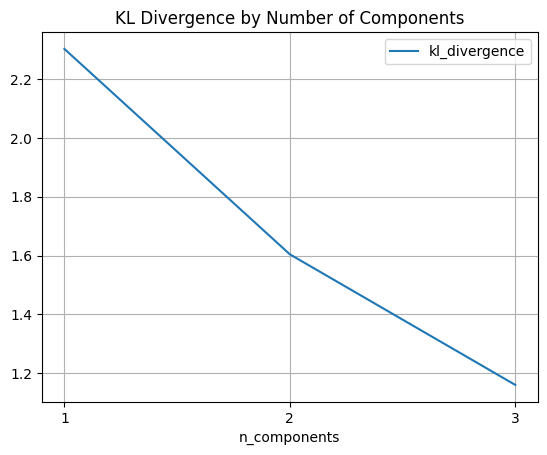

In [161]:
tsne_kl_divergence_df  = pd.DataFrame(tsne_kl_divergence.items(), columns=['n_components', 'kl_divergence'])
tsne_kl_divergence_df.plot(x='n_components', y='kl_divergence', title='KL Divergence by Number of Components', xticks=tsne_kl_divergence_df['n_components'], grid=True)

c:\Users\pavan\anaconda3\envs\ml\Lib\site-packages\daal4py\sklearn\manifold\_t_sne.py:396: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


<Axes: >

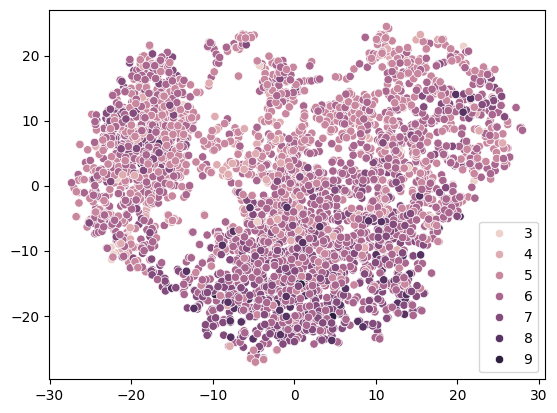

In [162]:
X_transformed = dr_pipeline.fit_transform(X_train)
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1], hue=y_train.values.ravel())

<Axes: >

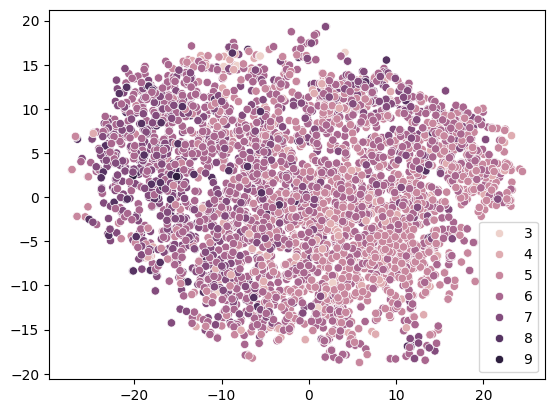

In [163]:
sns.scatterplot(x=X_transformed[:, 1], y=X_transformed[:, 2], hue=y_train.values.ravel())

<Axes: >

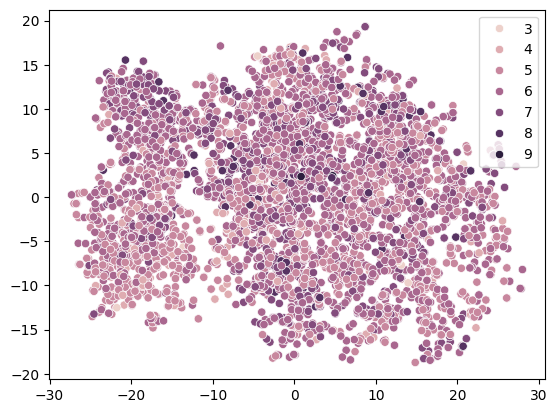

In [164]:

sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 2], hue=y_train.values.ravel())